In [1]:
# prompt: Importar o csv chamado soil_simulated do disco local para um dataframe

import pandas as pd
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

# Assuming the uploaded file is 'soil_simulated.csv'
df = pd.read_csv('soil_simulated.csv')



Saving soil_simulated.csv to soil_simulated.csv
User uploaded file "soil_simulated.csv" with length 268556 bytes


In [2]:
# prompt: Calcular as estatísticas básicas das variáveis.

# Calcula as estatísticas descritivas para cada coluna do DataFrame
estatisticas_basicas = df.describe()

# Exibe as estatísticas básicas
estatisticas_basicas

# Você também pode calcular estatísticas individuais para colunas específicas
# Por exemplo, a média da coluna 'pH'
# media_ph = df['pH'].mean()
# print(f"Média do pH: {media_ph}")

,Time,Temperature_Surface,Temperature_10cm,Temperature_50cm,Moisture_Surface,Moisture_10cm,Moisture_50cm,Water_Content_Surface,Water_Content_10cm,Water_Content_50cm,Nitrogen,Phosphorous,Potassium,pH,EC
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,499.500000,15.662028,14.948450,14.066862,0.298467,0.396259,0.497663,0.118881,0.158888,0.199432,49.759316,29.401372,99.552244,6.474519,0.632135
std,288.819436,7.297908,6.855993,6.365079,0.109927,0.081941,0.050369,0.048423,0.039263,0.028808,19.302465,14.556054,40.589577,0.486967,0.058646
min,0.000000,-1.278672,1.809551,2.224551,0.000000,0.139626,0.355024,0.000000,0.028041,0.102389,-28.448005,-18.488481,-35.023164,5.101309,0.434905
25%,249.750000,8.974473,8.373400,7.888949,0.221376,0.345401,0.465315,0.086531,0.133206,0.179615,37.133317,19.696508,73.685574,6.148611,0.593195
50%,499.500000,16.151658,15.554195,14.736383,0.296756,0.398241,0.497859,0.117485,0.160856,0.199978,50.087322,29.155287,98.709213,6.474866,0.631653
75%,749.250000,22.152025,21.427844,20.220713,0.377589,0.454820,0.530622,0.153128,0.183850,0.218033,63.014843,39.185026,125.396275,6.807561,0.671194
max,999.000000,30.465001,27.637661,24.651738,0.597236,0.678868,0.654915,0.255829,0.288996,0.287595,105.367472,73.711638,235.110730,8.110757,0.837623


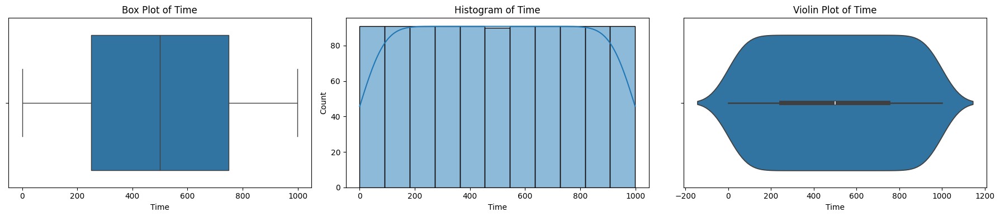

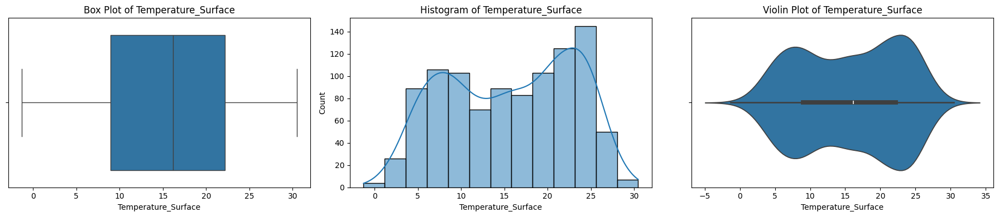

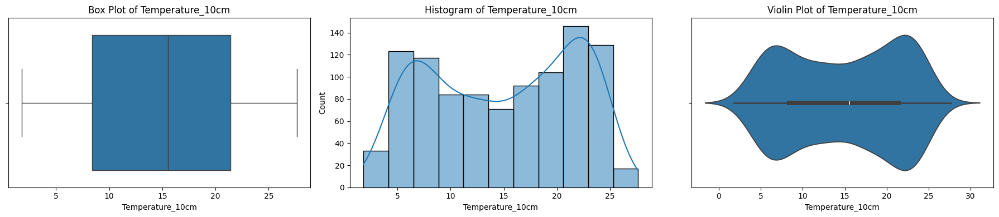

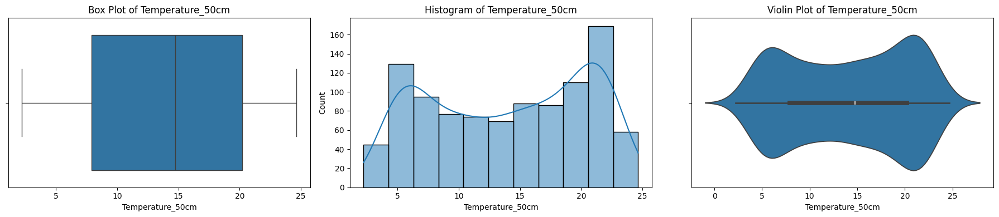

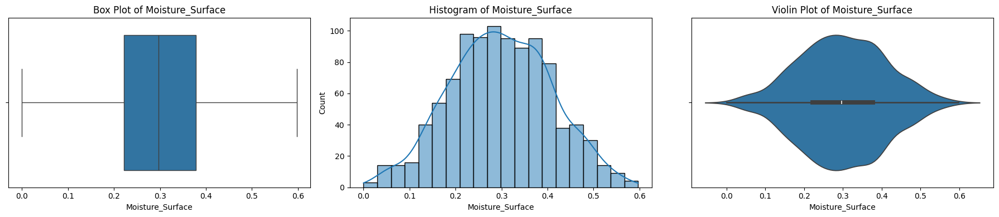

...

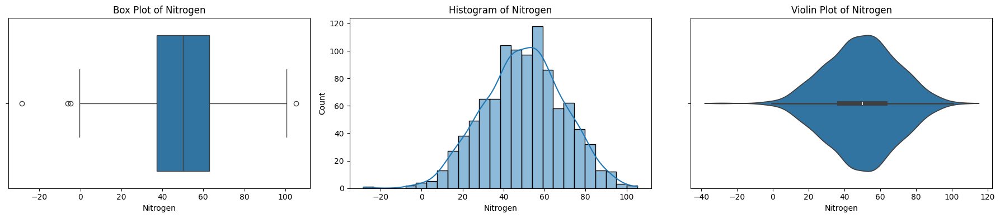

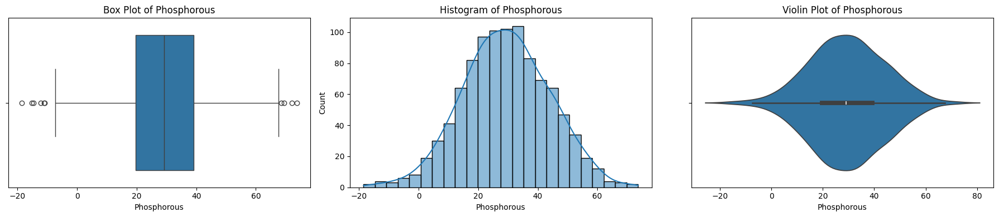

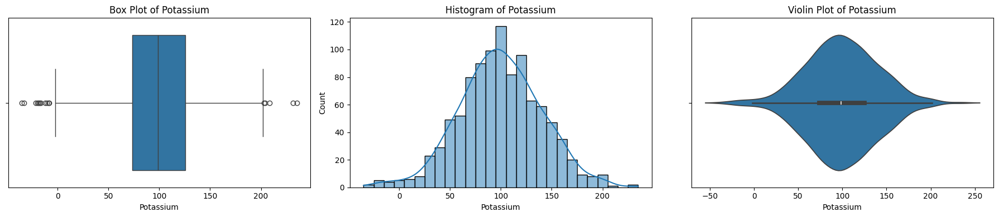

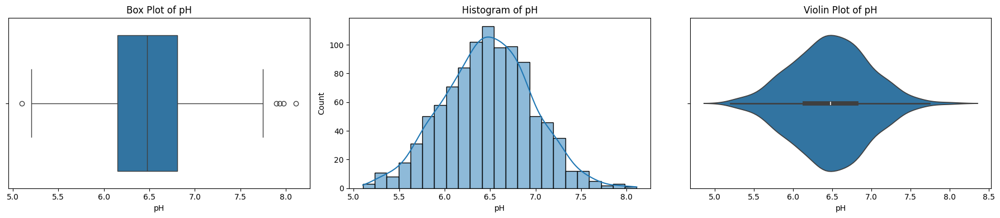

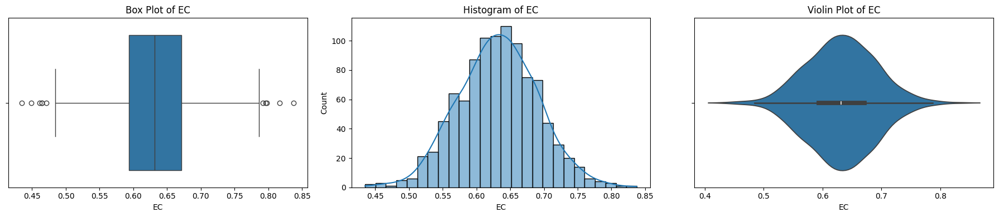

In [3]:
# prompt: Gerar três tipos de gráficos para analisar as variáveis. Para cada variável, agrupar os gráficos em linha.

import matplotlib.pyplot as plt
import seaborn as sns

# Get the numerical columns
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Iterate through each numerical column and generate plots
for col in numerical_cols:
    plt.figure(figsize=(18, 4))

    # Box plot
    plt.subplot(1, 3, 1)
    sns.boxplot(x=df[col])
    plt.title(f'Box Plot of {col}')

    # Histogram
    plt.subplot(1, 3, 2)
    sns.histplot(df[col], kde=True)
    plt.title(f'Histogram of {col}')

    # Violin plot
    plt.subplot(1, 3, 3)
    sns.violinplot(x=df[col])
    plt.title(f'Violin Plot of {col}')

    plt.tight_layout()
    plt.show()


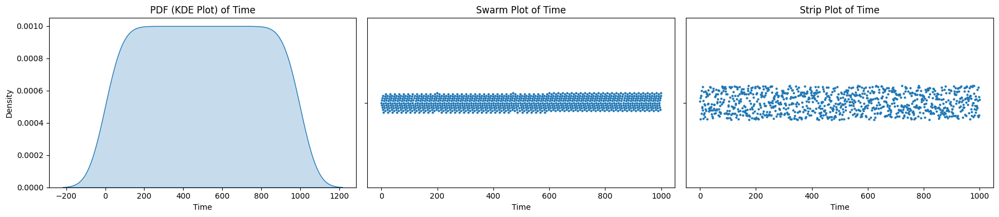

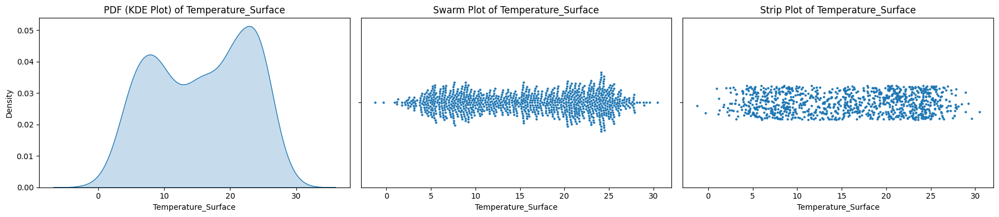

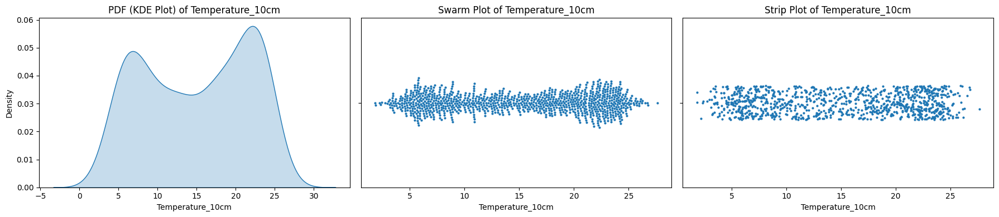

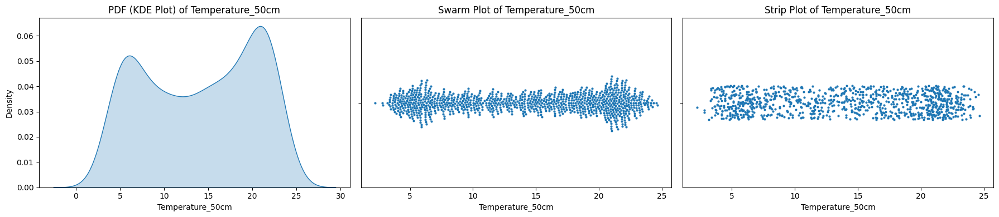

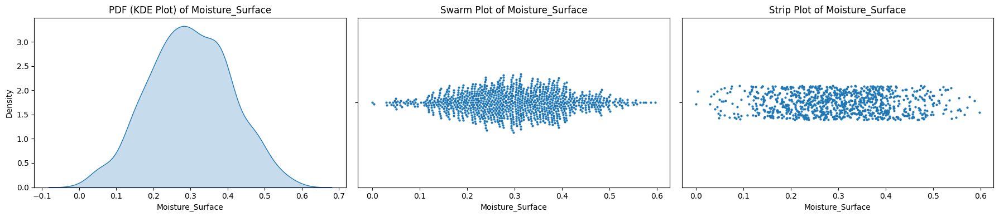

...

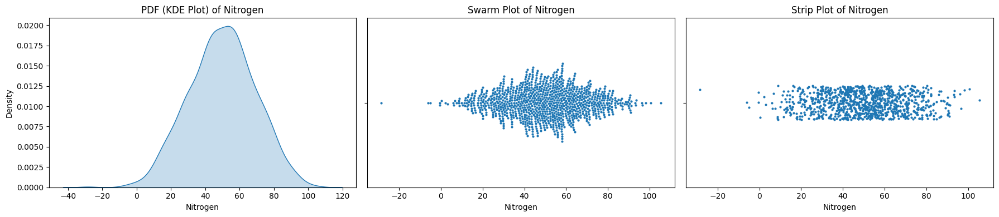

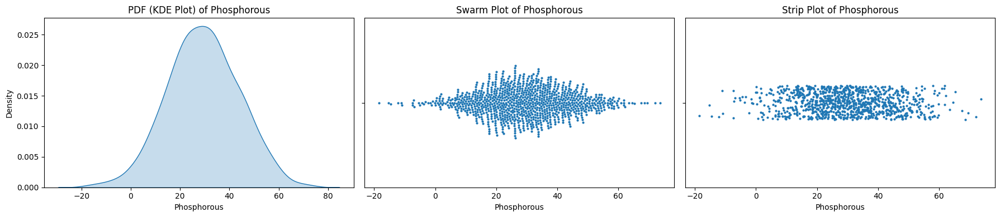

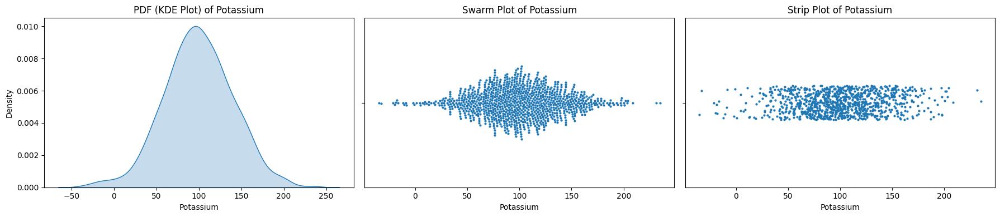

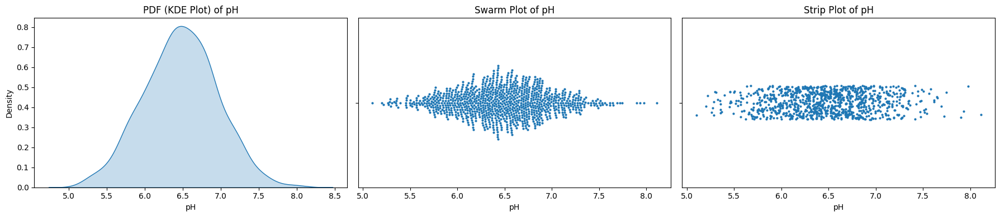

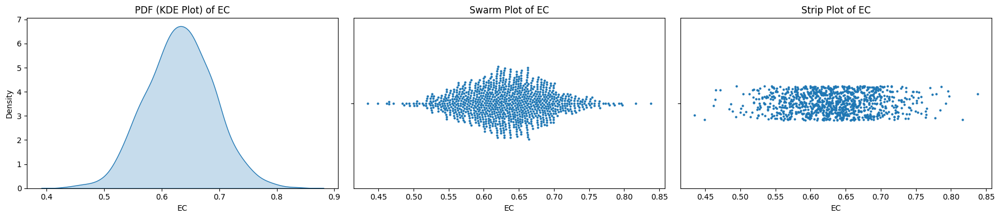

In [4]:
# prompt: Criar outros três gráficos univariados, como por exemplo função densidade de probabilidade, o Swarn plot e o strip plot.

import matplotlib.pyplot as plt
# Iterate through each numerical column and generate plots
for col in numerical_cols:
    plt.figure(figsize=(18, 4))

    # Probability Density Function (KDE plot)
    plt.subplot(1, 3, 1)
    sns.kdeplot(df[col], fill=True)
    plt.title(f'PDF (KDE Plot) of {col}')

    # Swarm plot
    plt.subplot(1, 3, 2)
    sns.swarmplot(x=df[col], size=3) # size can be adjusted
    plt.title(f'Swarm Plot of {col}')

    # Strip plot
    plt.subplot(1, 3, 3)
    sns.stripplot(x=df[col], jitter=True, size=3) # jitter and size can be adjusted
    plt.title(f'Strip Plot of {col}')

    plt.tight_layout()
    plt.show()

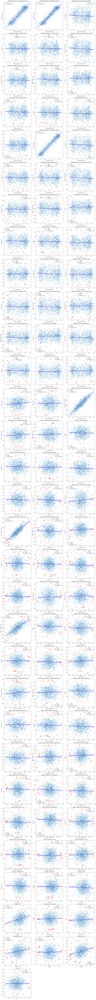

In [5]:
# prompt: Explorar os pares de variáveis com diagramas de dispersão. Se houver outliers, assinalar com um símbolo diferente. Não incluir a variável Tempo. Adicionar uma linha da relação, e agrupar os gráficos em três.

import matplotlib.pyplot as plt
# Drop the 'Tempo' column if it exists
if 'Time' in df.columns:
    df_no_tempo = df.drop(columns=['Time'])
else:
    df_no_tempo = df.copy()

# Get the numerical columns, excluding 'Tempo'
numerical_cols_no_tempo = df_no_tempo.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Define a function to find outliers using the IQR method
def find_outliers_iqr(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    return outliers.index.tolist()

# Generate scatter plots for all pairs of variables (excluding 'Tempo')
n_cols = len(numerical_cols_no_tempo)
n_pairs = n_cols * (n_cols - 1) // 2
plots_per_row = 3

fig, axes = plt.subplots((n_pairs + plots_per_row - 1) // plots_per_row, plots_per_row, figsize=(18, 6 * ((n_pairs + plots_per_row - 1) // plots_per_row)))
axes = axes.flatten()

plot_index = 0
for i in range(n_cols):
    for j in range(i + 1, n_cols):
        col1 = numerical_cols_no_tempo[i]
        col2 = numerical_cols_no_tempo[j]

        ax = axes[plot_index]

        # Plot the scatter plot
        sns.scatterplot(data=df_no_tempo, x=col1, y=col2, ax=ax, s=20, label='Data')

        # Find outliers in both columns for this pair
        outliers1_indices = find_outliers_iqr(df_no_tempo[col1])
        outliers2_indices = find_outliers_iqr(df_no_tempo[col2])

        # Identify points that are outliers in either column
        outlier_indices = list(set(outliers1_indices + outliers2_indices))

        # Highlight outliers
        if outlier_indices:
            outlier_df = df_no_tempo.loc[outlier_indices]
            sns.scatterplot(data=outlier_df, x=col1, y=col2, ax=ax, color='red', marker='X', s=100, label='Outlier')

        # Add regression line
        sns.regplot(data=df_no_tempo, x=col1, y=col2, ax=ax, scatter=False, color='blue', line_kws={"alpha": 0.7}, label='Regression Line')

        ax.set_title(f'{col1} vs {col2}')
        ax.legend()

        plot_index += 1

# Hide unused subplots
for i in range(plot_index, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


Q. Os outliers identificados são de primeira ou segunda ordem?





Q. Para que pares de variáveis é possível identificar uma relação?

Matriz de Correlação:
                       Temperature_Surface  Temperature_10cm  \
Temperature_Surface               1.000000          0.937737   
Temperature_10cm                  0.937737          1.000000   
Temperature_50cm                  0.952687          0.963831   
Moisture_Surface                 -0.078187         -0.088221   
Moisture_10cm                    -0.016292         -0.013318   
Moisture_50cm                    -0.052100         -0.046282   
Water_Content_Surface            -0.085509         -0.090934   
Water_Content_10cm               -0.016869         -0.014349   
Water_Content_50cm               -0.092134         -0.083624   
Nitrogen                          0.043612          0.045702   
Phosphorous                      -0.041254         -0.041092   
Potassium                        -0.035063         -0.036497   
pH                               -0.027509         -0.004378   
EC                                0.009673          0.015488   

                 

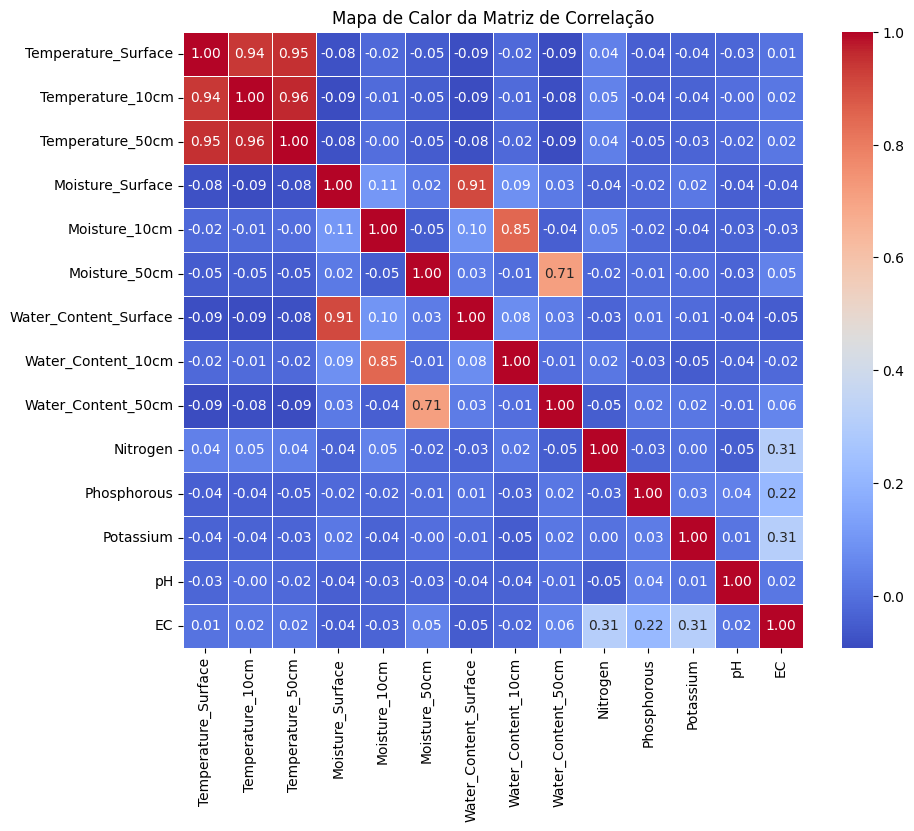

In [6]:
# prompt: Calcular a correlação entre todas as variáveis. Assinalar as que são significativas.

import matplotlib.pyplot as plt
# Calculate the correlation matrix
correlation_matrix = df_no_tempo.corr()

# Display the correlation matrix
print("Matriz de Correlação:")
print(correlation_matrix)

# You can visually inspect the matrix or set a threshold for significance
# For example, consider correlations with absolute value greater than 0.5 as potentially significant
significant_correlations = correlation_matrix[(abs(correlation_matrix) > 0.5) & (correlation_matrix != 1.0)]

print("\nCorrelações Potencialmente Significativas (|r| > 0.5):")
print(significant_correlations)

# To test for statistical significance (p-values), you would typically use libraries like scipy.stats
# This requires more rigorous statistical testing (e.g., Pearson correlation test)
# and consideration of sample size.
# For simplicity, we'll just highlight strong correlations based on the absolute value.

# You can also visualize the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Mapa de Calor da Matriz de Correlação')
plt.show()


Variância explicada por cada componente principal:
[0.2128917  0.14662094 0.12520932 0.11694567 0.10520812 0.07628879
 0.06864638 0.0673129  0.03627654 0.02041637 0.01071747 0.0066061
 0.00450757 0.00235213]

Variância explicada acumulada:
[0.2128917  0.35951264 0.48472196 0.60166763 0.70687574 0.78316454
 0.85181092 0.91912382 0.95540036 0.97581673 0.9865342  0.9931403
 0.99764787 1.        ]

DataFrame com os componentes principais:
        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0  0.742366 -2.198869 -1.537129  0.358311 -0.990658 -0.262309 -0.675241   
1  0.386854 -1.006311 -0.808939  0.009575  1.088339 -1.987898  0.097754   
2  0.332254  0.308325 -2.057861 -1.011209  0.161520 -0.573280  1.085249   
3 -0.606223  2.427277  1.074155 -1.032933 -0.809012  1.350912  1.148409   
4 -0.578269 -0.392830  2.224452  0.078528  1.049966  0.795043  0.003060   

        PC8       PC9      PC10      PC11      PC12      PC13      PC14  
0  1.569946  0.043238  0.083597 -0.3

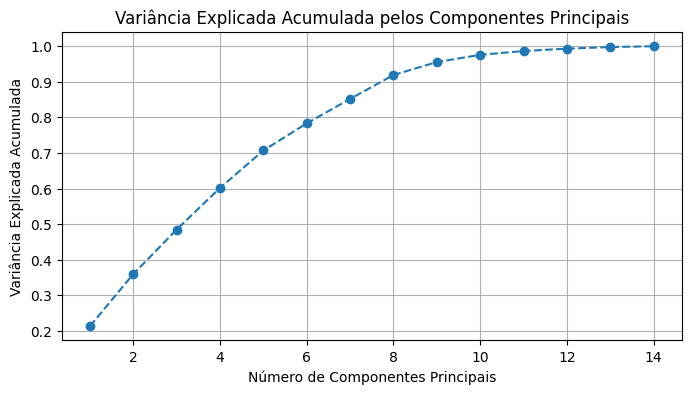


Loadings (Pesos das variáveis nos Componentes Principais):
                            PC1       PC2       PC3       PC4       PC5  \
Temperature_Surface    0.555601  0.091709  0.108289  0.011145  0.002790   
Temperature_10cm       0.557958  0.088109  0.108431  0.020232  0.003421   
Temperature_50cm       0.559957  0.096673  0.109921  0.013942  0.005365   
Moisture_Surface      -0.140879  0.485389  0.362015 -0.307817  0.127864   
Moisture_10cm         -0.033468  0.489547 -0.319715  0.384572  0.016385   
Moisture_50cm         -0.084370 -0.068904  0.500485  0.469514 -0.126684   
Water_Content_Surface -0.143789  0.480695  0.364919 -0.312251  0.118749   
Water_Content_10cm    -0.036869  0.475877 -0.305642  0.416222 -0.005041   
Water_Content_50cm    -0.109664 -0.075164  0.492717  0.469485 -0.116750   
Nitrogen               0.046364 -0.013024 -0.067253  0.109613  0.427583   
Phosphorous           -0.034431 -0.071516  0.021416  0.027589  0.309690   
Potassium             -0.027240 -0.08383

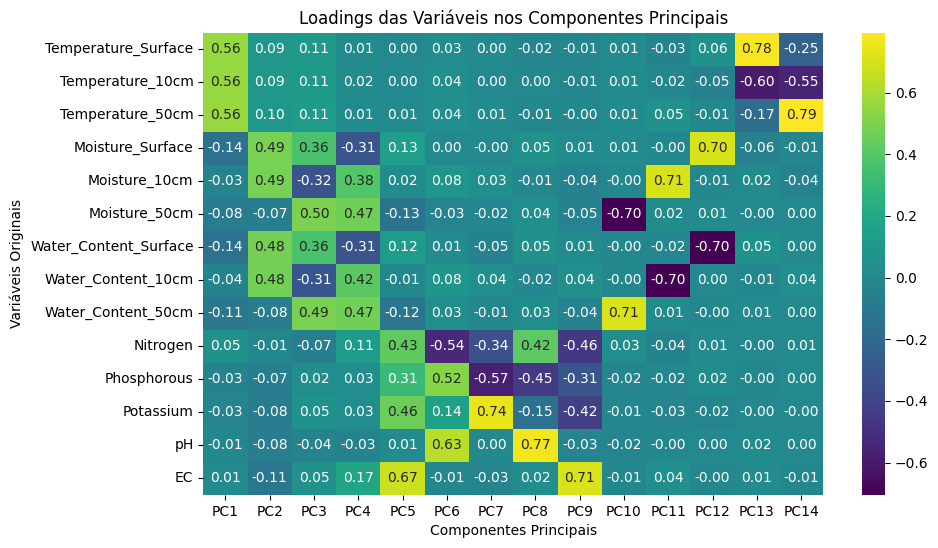

In [7]:
# prompt: Calcular a Análise em Componentes Principais para o dataset.

import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Padronizar os dados
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_no_tempo)

# Aplicar PCA
pca = PCA()
pca.fit(df_scaled)

# Exibir a variância explicada por cada componente
print("Variância explicada por cada componente principal:")
print(pca.explained_variance_ratio_)

# Exibir a variância explicada acumulada
print("\nVariância explicada acumulada:")
print(pca.explained_variance_ratio_.cumsum())

# Obter os componentes principais
componentes = pca.transform(df_scaled)

# Opcional: Criar um DataFrame com os componentes principais
df_componentes = pd.DataFrame(data = componentes, columns = [f'PC{i+1}' for i in range(componentes.shape[1])])
print("\nDataFrame com os componentes principais:")
print(df_componentes.head())

# Visualizar a variância explicada
plt.figure(figsize=(8, 4))
plt.plot(range(1, pca.n_components_ + 1), pca.explained_variance_ratio_.cumsum(), marker='o', linestyle='--')
plt.title('Variância Explicada Acumulada pelos Componentes Principais')
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Variância Explicada Acumulada')
plt.grid(True)
plt.show()

# Visualizar os loadings (pesos) de cada variável nos componentes principais
# Loadings são os eigenvectors multiplicados pela raiz quadrada dos eigenvalues
# Em sklearn, os componentes (pca.components_) são os eigenvectors
loadings = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(pca.n_components_)], index=df_no_tempo.columns)
print("\nLoadings (Pesos das variáveis nos Componentes Principais):")
print(loadings)

# Visualizar os loadings (opcional)
plt.figure(figsize=(10, 6))
sns.heatmap(loadings, annot=True, cmap='viridis', fmt=".2f")
plt.title('Loadings das Variáveis nos Componentes Principais')
plt.xlabel('Componentes Principais')
plt.ylabel('Variáveis Originais')
plt.show()

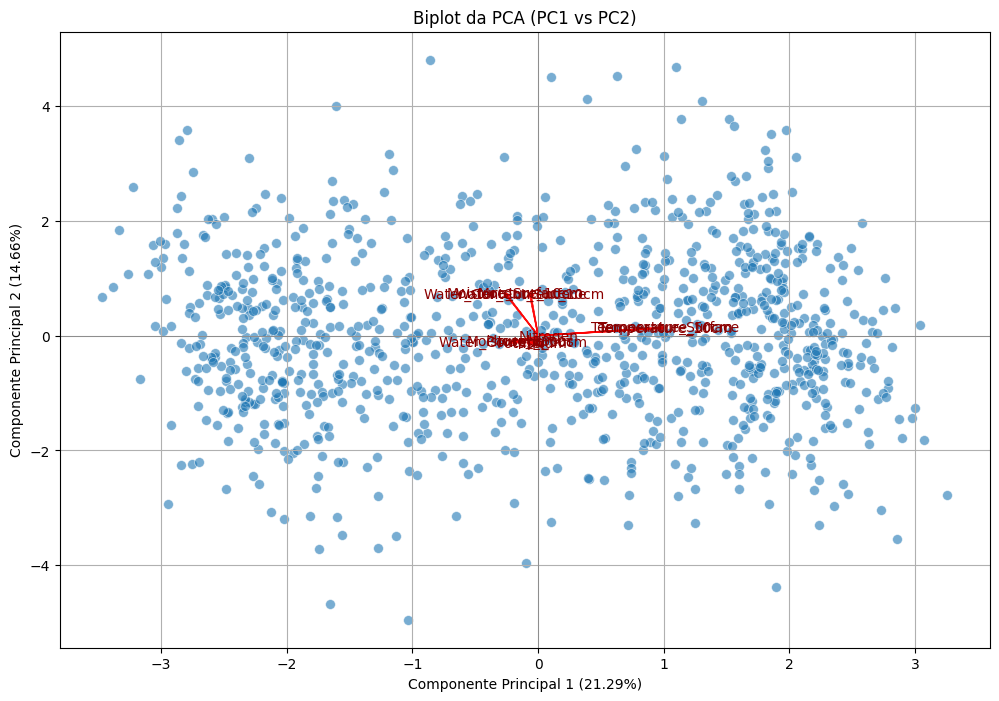

In [14]:
# prompt: Representar o biplot da PCA para os primeiro e segundo planos factoriais.

import matplotlib.pyplot as plt
import numpy as np
# Obter os escores (componentes) e os loadings
pca_scores = pca.transform(df_scaled)
pca_loadings = pca.components_.T * np.sqrt(pca.explained_variance_) # Multiplicar pelos desvios padrão (raiz quadrada da variância explicada)

# Plot do Biplot para PC1 e PC2
plt.figure(figsize=(12, 8))

# Plotar os pontos dos dados projetados nos primeiros dois componentes (escores)
sns.scatterplot(x=pca_scores[:, 0], y=pca_scores[:, 1], s=50, alpha=0.6)

# Adicionar os loadings como vetores
for i, var in enumerate(df_no_tempo.columns):
    plt.arrow(0, 0, pca_loadings[i, 0], pca_loadings[i, 1], color='red', alpha=0.8, head_width=0.05, head_length=0.05)
    plt.text(pca_loadings[i, 0]*1.05, pca_loadings[i, 1]*1.05, var, color='darkred', ha='center', va='center')

plt.xlabel(f'Componente Principal 1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'Componente Principal 2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.title('Biplot da PCA (PC1 vs PC2)')
plt.grid(True)
plt.axhline(0, color='grey', lw=0.5)
plt.axvline(0, color='grey', lw=0.5)
plt.show()

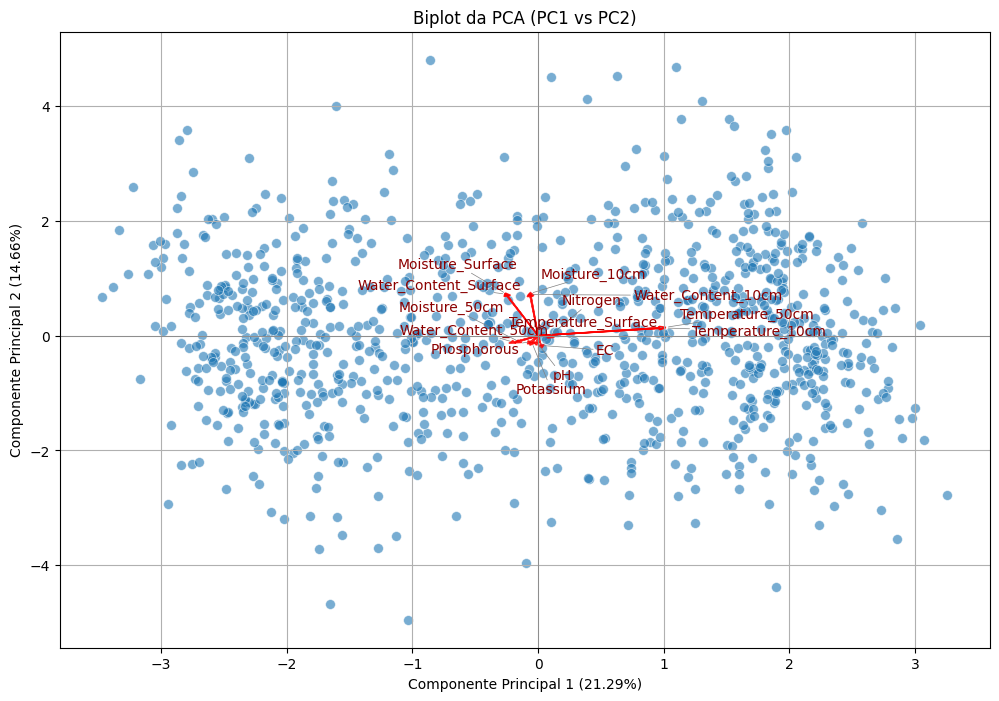

In [15]:
# prompt: No plot da PCA, evitar a sobreposição dos labels das variáveis para melhorar a visualização. Se for necessário, usar abreviaturas das variáveis.

!pip install adjustText

import matplotlib.pyplot as plt
import numpy as np
from adjustText import adjust_text

# Obter os escores (componentes) e os loadings
pca_scores = pca.transform(df_scaled)
pca_loadings = pca.components_.T * np.sqrt(pca.explained_variance_) # Multiplicar pelos desvios padrão (raiz quadrada da variância explicada)

# Plot do Biplot para PC1 e PC2
plt.figure(figsize=(12, 8))

# Plotar os pontos dos dados projetados nos primeiros dois componentes (escores)
sns.scatterplot(x=pca_scores[:, 0], y=pca_scores[:, 1], s=50, alpha=0.6)

texts = []
# Adicionar os loadings como vetores
for i, var in enumerate(df_no_tempo.columns):
    plt.arrow(0, 0, pca_loadings[i, 0], pca_loadings[i, 1], color='red', alpha=0.8, head_width=0.05, head_length=0.05)
    # Use adjust_text to position the labels
    texts.append(plt.text(pca_loadings[i, 0]*1.05, pca_loadings[i, 1]*1.05, var, color='darkred', ha='center', va='center'))

# Use adjust_text to prevent label overlap
adjust_text(texts, arrowprops=dict(arrowstyle='-', color='grey', lw=0.5))

plt.xlabel(f'Componente Principal 1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'Componente Principal 2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.title('Biplot da PCA (PC1 vs PC2)')
plt.grid(True)
plt.axhline(0, color='grey', lw=0.5)
plt.axvline(0, color='grey', lw=0.5)
plt.show()


Gerar o gráfico para o segundo plano factorial (eixos factoriais 1 e 3).

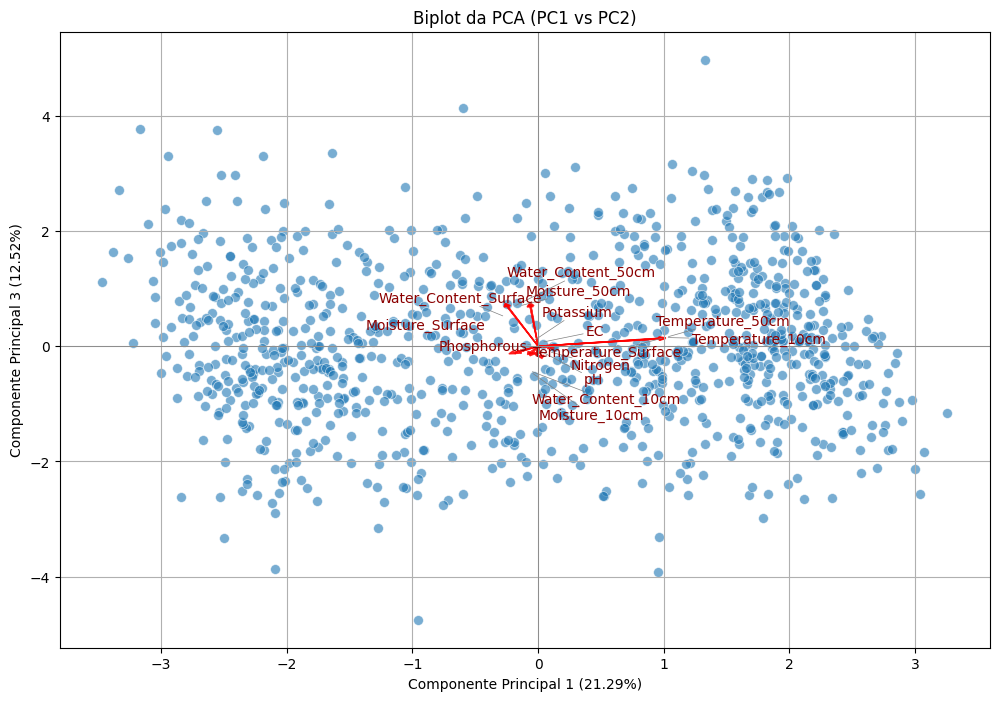

In [18]:

# Obter os escores (componentes) e os loadings
pca_scores = pca.transform(df_scaled)
pca_loadings = pca.components_.T * np.sqrt(pca.explained_variance_) # Multiplicar pelos desvios padrão (raiz quadrada da variância explicada)

# Plot do Biplot para PC1 e PC3
plt.figure(figsize=(12, 8))

# Plotar os pontos dos dados projetados nos primeiros dois componentes (escores)
sns.scatterplot(x=pca_scores[:, 0], y=pca_scores[:, 2], s=50, alpha=0.6)

texts = []
# Adicionar os loadings como vetores
for i, var in enumerate(df_no_tempo.columns):
    plt.arrow(0, 0, pca_loadings[i, 0], pca_loadings[i, 1], color='red', alpha=0.8, head_width=0.05, head_length=0.05)
    # Use adjust_text to position the labels
    texts.append(plt.text(pca_loadings[i, 0]*1.05, pca_loadings[i, 2]*1.05, var, color='darkred', ha='center', va='center'))

# Use adjust_text to prevent label overlap
adjust_text(texts, arrowprops=dict(arrowstyle='-', color='grey', lw=0.5))

plt.xlabel(f'Componente Principal 1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'Componente Principal 3 ({pca.explained_variance_ratio_[2]*100:.2f}%)')
plt.title('Biplot da PCA (PC1 vs PC2)')
plt.grid(True)
plt.axhline(0, color='grey', lw=0.5)
plt.axvline(0, color='grey', lw=0.5)
plt.show()


Q. As relações apresentadas fazem sentido?